In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.linalg import norm
import matplotlib as matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
## Sætter grænseværdien for animationsstørrelsen op##
matplotlib.rcParams['animation.embed_limit'] = 2**128

# En vogn på en fjeder

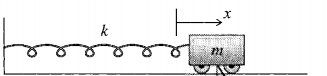

Fuldstændig bestemt ved de 2 koordinater $x_1,x_2$. Energiforholdende er:
\begin{align}
T&=\frac{m}{2}\dot{x}^2\\
U&=\frac{k}{2}{x}^2 \\
\end{align}
giver:
\begin{equation}
\mathcal{L(x,\dot{x})}=\frac{m}{2}\dot{x}^2-\frac{k}{2}{x}^2
\end{equation}
hvoraf vi finder bevægelsesligningen:
\begin{align}
\frac{\partial \mathcal{L}}{\partial x}&=\frac{d}{dt}\bigg(\frac{\partial \mathcal{L}}{\partial \dot{x}}\bigg)\\
-kx&=m\ddot{x}\\
\ddot{x}&=-\frac{k}{m}x
\end{align}


In [2]:
## Konstanternes værdi ##
m, k = 2, 350.5

##startbetingelser
x_0 = 2
x_prik_0 = 0
yinit = [x_0,x_prik_0]

tinit = 0
tfinal = 5
trange = [tinit,tfinal]
ts = np.linspace(tinit, tfinal, 1000)

def dydt(t,y):
    x = y[0]
    x_prik = y[1]
    
    d_x_dt = x_prik
    d_x_prik_dt = -(k/m)*x
    
    return [d_x_dt,d_x_prik_dt]

mysol = solve_ivp(dydt, trange, yinit, t_eval = ts,rtol=3e-14)
ts = mysol.t
x = mysol.y[0]
x_prik = mysol.y[1]

Text(0.5, 0, '$t$')

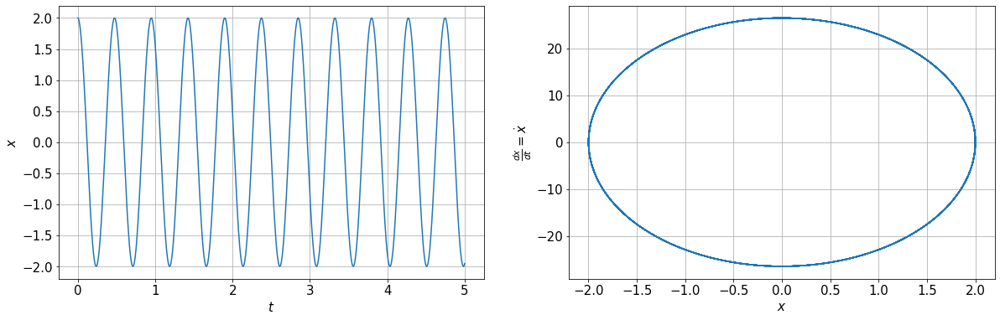

In [3]:
plt.rc('font', size=15)
fig,ax = plt.subplots(1,2,figsize=(20,6))
ax[1].plot(x,x_prik)
ax[0].plot(ts,x)
ax[0].grid(),ax[1].grid()

ax[1].set_xlabel('$x$')
ax[1].set_ylabel(r'$\frac{dx}{dt}=\dot{x}$')

ax[0].set_ylabel('$x$')
ax[0].set_xlabel('$t$')


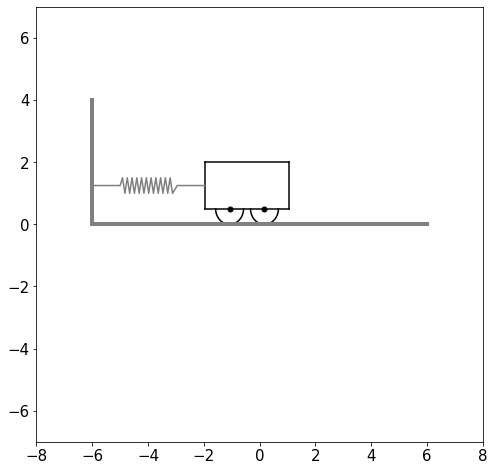

In [4]:
fig, ax = plt.subplots(figsize=(8, 8))

cart_height, cart_width = 2, 3
wheel_radius = 0.5

cart_line1, = ax.plot([],[],color='black') ## Backwall of cart
cart_line2, = ax.plot([],[],color='black') ## Buttom of cart
cart_line3, = ax.plot([],[],color='black') ## Frontwall of cart
cart_line4, = ax.plot([],[],color='black') ## Roof of cart

cart_wheel1, = ax.plot([],[],color='black') ## Rear wheel
cart_wheel2, = ax.plot([],[],color='black') ## Front wheel

cart_wheel1_center, = ax.plot([],[],'o',ms=5,color='black')
cart_wheel2_center, = ax.plot([],[],'o',ms=5,color='black')


spring, = ax.plot([],[],color='grey')     ## Spring


def draw_spring(anchor_x0,anchor_y0,box_x0,box_y0,nr_turns,spring_width,buffer_length):
    D, R, N = buffer_length, spring_width, nr_turns
    x1, y1, x2, y2 = anchor_x0, anchor_y0, box_x0, box_y0
    spring_length = abs(x2-x1)-2*D

    xs = [x1,x1+D]
    ys = [y1,y1]
    
    k = 1
    for i in range(N-2):
        k*=-1
        if k<0:
            ys.append(y1+R)
        if k>0:
            ys.append(y1-R)
            
        x_temp = xs[i+1]+spring_length/N
        xs.append(x_temp)
        
    for j in range(2):
        xs.append(x1+spring_length+D*(j+1))
        ys.append(y1)
        
    return xs, ys

def draw_wheel(wheel_center, radius):
    R, y0, x0 = radius, radius, wheel_center
    xs = np.linspace(wheel_center-radius,wheel_center+radius,1000)
    ys = y0-np.sqrt(abs(R**2-(xs-x0)**2))
    return xs, ys

def update(i):
    
    ## Plotting cart ##
    cart_line1.set_data(x[i],[wheel_radius,cart_height])
    cart_line2.set_data([x[i],x[i]+cart_width],[wheel_radius,wheel_radius])
    cart_line3.set_data(x[i]+cart_width,[wheel_radius,cart_height])
    cart_line4.set_data([x[i],x[i]+cart_width],[cart_height,cart_height])
    
    ## Plotting wheels ##
    cart_wheel1_x, cart_wheel1_y = draw_wheel(x[i]+cart_width/8+wheel_radius,wheel_radius)
    cart_wheel2_x, cart_wheel2_y = draw_wheel(x[i]+cart_width-cart_width/8-wheel_radius,wheel_radius)
    
    cart_wheel1.set_data([cart_wheel1_x],[cart_wheel1_y])
    cart_wheel2.set_data([cart_wheel2_x],[cart_wheel2_y])

    cart_wheel1_center.set_data([x[i]+cart_width/8+wheel_radius],[wheel_radius])
    cart_wheel2_center.set_data([x[i]+cart_width-cart_width/8-wheel_radius],[wheel_radius])

    
    ## Plotting spring ##
    spring_x, spring_y = draw_spring(-3*x_0,(cart_height+wheel_radius)/2,x[i],(cart_height+wheel_radius)/2,24,0.25,1)
    spring.set_data([spring_x],[spring_y])
    
    return cart_line1, cart_line2, cart_line3, cart_line4, spring,

## plotting ramp ##
ax.plot([-3*x_0,3*x_0],[0,0], linewidth = 4, color = 'grey')
ax.plot([-3*x_0,-3*x_0],[0,4], linewidth = 4, color = 'grey')

## setting axes ## 
ax.set_xlim(-4*x_0,4*x_0)
ax.set_ylim(-7,7)

## animating ## 
anim = animation.FuncAnimation(fig,
                               update,
                               frames=len(ts),
                               interval=10,
                               blit=True,
                               repeat_delay=0)
anim

6
[-6, -5, -4.823529411764706, -4.647058823529411, -4.470588235294117, -4.2941176470588225, -4.117647058823528, -3.941176470588234, -3.7647058823529402, -3.5882352941176463, -3.4117647058823524, -3.2352941176470584, -3.0588235294117645, -2.8823529411764706, -2.7058823529411766, -2.5294117647058827, -2.3529411764705888, -2.176470588235295, -2.000000000000001, -1.8235294117647067, -1.6470588235294126, -1.4705882352941184, -1.2941176470588243, -1.11764705882353, -0.941176470588236, -0.7647058823529418, -0.5882352941176476, -0.4117647058823535, -0.23529411764705935, -0.05882352941176522, 0.11764705882352891, 0.29411764705882304, 0.4705882352941172, 0.6470588235294114, 1, 2]


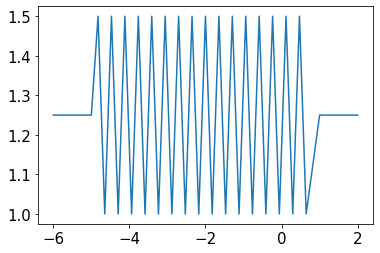

In [86]:
def draw_spring(anchor_x0,anchor_y0,box_x0,box_y0,nr_turns,spring_width,buffer_length):
    D, R, N = buffer_length, spring_width, nr_turns
    x1, y1, x2, y2 = anchor_x0, anchor_y0, box_x0, box_y0
    spring_length = abs(x2-x1)-2*D
    print(spring_length)
    xs = [x1,x1+D]
    ys = [y1,y1]
    
    k = 1
    for i in range(N-2):
        k*=-1
        if k<0:
            ys.append(y1+R)
        if k>0:
            ys.append(y1-R)
            
        x_temp = xs[i+1]+spring_length/N
        xs.append(x_temp)
        
    for j in range(2):
        xs.append(x1+spring_length+D*(j+1))
        ys.append(y1)
        
    return xs, ys

xvals, yvals = draw_spring(-6,2.5/2,2,2.5/2,34,0.25,1)

plt.plot(xvals,yvals)#, plt.xlim(-8,8), plt.ylim(-7,7)
print(xvals)

([<matplotlib.lines.Line2D at 0x14fb6a476c8>], (-2, 2), (-2, 2))

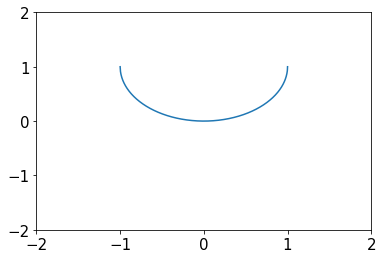

In [111]:
def draw_wheel(wheel_center, radius):
    R, y0, x0 = radius, radius, wheel_center
    xs = np.linspace(wheel_center-radius,wheel_center+radius,1000)
    ys = y0-np.sqrt(abs(R**2-(xs-x0)**2))
    return xs, ys

xs, ys = draw_wheel(0,1)
plt.plot(xs,ys),plt.xlim(-2,1.),plt.ylim(-2,2)